# Heart Attack - Kaggle competition  V 3.0

Author: _Aniko Maraz, PhD_

<div class="alert alert-block alert-info">
    
This is an <a href="https://www.kaggle.com/competitions/heart-attack-risk-analysis/overview">active Kaggle competition</a>  for Kudos. <br>    
The task is to predict (on an unseen dataset) if the patient is at low or high risk of heart attack.  <br>

I explored and engineered the features, tested 7 potential models in the pipeline and picked the best 2 performing: SVC and  Neural Network, because both had similar accuracy. Then I proceeded with hypertuning both models' parameters, to pick SVC in the end. Then I revisited the features, including checking the VIF values. Despite my best efforts the accuracy on the Kaggle test data did not improve from 0.63776. This got me to place 46, although places 9-46 have the exact same accuracy in the competition. <br>

Note, however, that my best model predicts all zeros (low risk) for the ~1700 test data from Kaggle. I have the impression that the test data is very different from the train (where ~35% was positive), making it challenging to find the best model. I am sure feature engineering would help to improve accuracy, but as this is an artificial dataset, in-depth looking for the Golden Egg does not really appeal to me. 
</div>

As an extra perk I proceeded with deploying this model. The SVC model described in this notebook is the old version running in production: 
<br> <br>
https://fake-heart-attack.streamlit.app/  
<br>
Since creating this notebook, I opted for a new version, where I optimise for precision, as this is a much better metric for a health data, where missing true cases has a high cost. If you are interested, see [this notebook](https://nbviewer.org/github/anikomaraz/heart_attack_kaggle/blob/main/notebooks/heart_attack_v5_probability_xgboost_KaggleV2.ipynb). <br> 
Further info and versions in my [Git Repo](https://github.com/anikomaraz/heart_attack_kaggle). <br> <br>


## Imports

In [1]:
import numpy as np
import pandas as pd
# from dataprep.eda import create_report

from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    OneHotEncoder,
)

from sklearn.metrics import accuracy_score, classification_report

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# because of version incompatibilities must run with:
# tensorflow ==2.12.0
# keras==2.12.0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from keras.layers import Input
from tensorflow.keras import Sequential

from scikeras.wrappers import KerasClassifier

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.inspection import permutation_importance

import jupyter_black
import warnings

%load_ext jupyter_black
%matplotlib inline

# Display all columns in the DataFrame throughout the Notebook
pd.set_option("display.max_columns", None)

import logging
import os


import warnings

warnings.filterwarnings("ignore")

2024-07-19 14:18:37.330581: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 14:18:37.334782: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 14:18:37.347995: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-19 14:18:37.369061: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-19 14:18:37.374842: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-19 14:18:37.388686: I tensorflow/core/platform/cpu_feature_gu

## DATA: GET AND EXPLORE

In [2]:
df_raw_train = pd.read_csv("../data/train.csv")
df_raw_train.shape

(7010, 26)

In [3]:
df_raw_train.head()

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,RDG0550,33,Male,200,129/90,48,0,1,1,1,1,7.807690,Unhealthy,0,1,2,0.138443,184066,30.449815,63,6,7,Argentina,South America,Southern Hemisphere,1
1,NMA3851,56,Female,262,159/105,46,1,0,1,0,0,17.297628,Average,1,0,8,0.369552,211755,34.973685,333,7,8,Nigeria,Africa,Northern Hemisphere,1
2,TUI5807,19,Female,140,161/109,54,0,1,0,0,1,8.695288,Average,1,1,3,8.646334,252203,30.554246,537,2,10,Thailand,Asia,Northern Hemisphere,0
3,YYT5016,50,Female,163,120/62,53,0,1,1,1,1,10.161587,Healthy,0,1,7,1.107884,121954,35.390265,591,0,9,Spain,Europe,Southern Hemisphere,1
4,ZAC5937,89,Female,144,153/110,92,1,0,1,0,1,16.436787,Healthy,1,0,1,1.337570,180121,39.575483,145,2,5,Germany,Europe,Northern Hemisphere,1


For the report on raw data see [here - html](https://nbviewer.org/github/anikomaraz/heart_attack_kaggle/blob/main/notebooks/report_heart_attack.html) or [here - pdf](https://github.com/anikomaraz/heart_attack_kaggle/blob/main/notebooks/DataPrep%20Report.pdf)

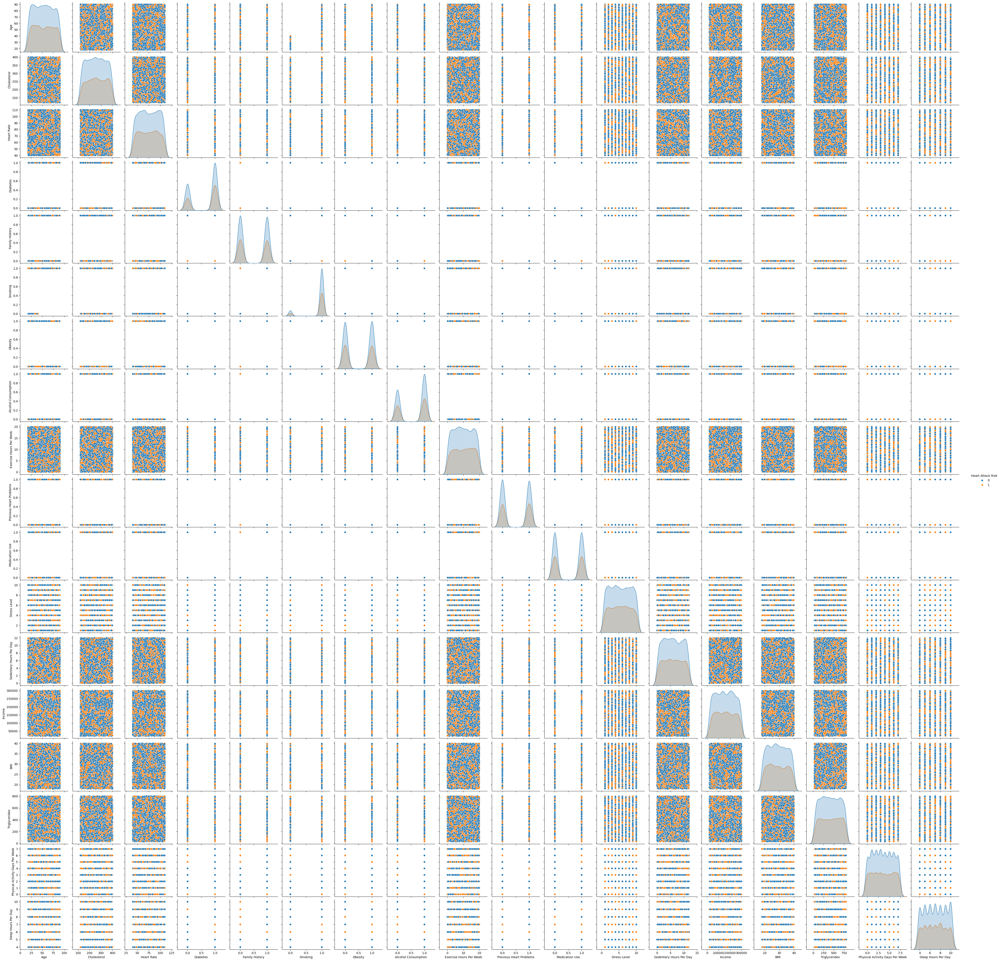

In [4]:
sns.pairplot(df_raw_train, hue="Heart Attack Risk");

The [statistical description of features](https://github.com/anikomaraz/heart_attack_kaggle/blob/main/notebooks/heart_attack_v1.ipynb) is available in V 1.0 of the notebook. Features' data contain no missing values or outliers, most features are close to normal distribution, classes contain approximately the same data points. There are 7010 rows (patients) and 25 features. About 35% of cases is positive (high risk of heart disease). 

## PREPROCESSING PIPELINE

In [5]:
# def function to split blood pressure data (current format: 129/90)
def split_blood_pressure(df):
    df[["Systolic", "Diastolic"]] = df["Blood Pressure"].str.split("/", expand=True)
    df["Systolic"] = pd.to_numeric(df["Systolic"])
    df["Diastolic"] = pd.to_numeric(df["Diastolic"])
    df.drop(columns=["Blood Pressure"], inplace=True)


# split cholesterol according to sample mean
cholesterol_sample_mean = df_raw_train["Cholesterol"].mean()


def split_cholesterol_sample(df):
    df["Cholesterol_sample_split"] = np.where(
        df["Cholesterol"] > cholesterol_sample_mean, 1, 0
    )


# total excercise
def exercise_total(df):
    df["Exercise Total"] = (
        df["Exercise Hours Per Week"] * df["Physical Activity Days Per Week"]
    )


# construct the ratio of systolic and diastolic blood pressure
def systolic_diastolic_ratio_constructor(df):
    df["Systolic_Diastolic_Ratio"] = df["Systolic"] / df["Diastolic"]


# create the new variables
df = df_raw_train.copy()

split_blood_pressure(df=df)
split_cholesterol_sample(df=df)
exercise_total(df=df)
systolic_diastolic_ratio_constructor(df=df)

### Define features

In [6]:
# Defining the features and the target
X = df.drop(columns="Heart Attack Risk")
y = df["Heart Attack Risk"]

In [7]:
# Opt-in continuous and categorical variables
continuous_vars = [
    "Age",
    # "Cholesterol",
    "Heart Rate",
    "Exercise Hours Per Week",
    "Stress Level",
    "Sedentary Hours Per Day",
    "Income",
    "BMI",
    "Triglycerides",
    "Physical Activity Days Per Week",
    "Sleep Hours Per Day",
    "Systolic",
    "Diastolic",
    # "Exercise Total",
    # "Systolic_Diastolic_Ratio",
]

categorical_vars = [
    "Diabetes",
    "Family History",
    "Obesity",
    "Alcohol Consumption",
    "Previous Heart Problems",
    "Medication Use",
    "Cholesterol_sample_split",
    # "Smoking",
    "Sex",
    "Continent",
    "Diet",
    "Hemisphere",
    # "Country",
]

X_selected = X[continuous_vars + categorical_vars]

### Create preprocessing pipeline and train/test data

In [8]:
# Define preprocessing steps for continuous and categorical features
num_transformer = MinMaxScaler()
cat_transformer = OneHotEncoder(drop="first")

preproc_basic = ColumnTransformer(
    transformers=[
        ("num", num_transformer, continuous_vars),
        ("cat", cat_transformer, categorical_vars),
    ],
    remainder="passthrough",
)


def create_nn_model():
    model = Sequential()
    model.add(Input(shape=(28,)))  # Use Input layer to define the input shape
    model.add(Dense(16, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))  # Output layer
    model.compile(loss="hinge", optimizer="adam", metrics=["accuracy"])
    return model


# Create pipelines for each classifier
logistic_regression_pipe = make_pipeline(
    preproc_basic, LogisticRegression(random_state=6)
)
svm_pipe = make_pipeline(preproc_basic, SVC(random_state=6))
xgboost_pipe = make_pipeline(preproc_basic, XGBClassifier(random_state=6))
decision_tree_pipe = make_pipeline(
    preproc_basic, DecisionTreeClassifier(random_state=6)
)
random_forest_pipe = make_pipeline(
    preproc_basic, RandomForestClassifier(random_state=6)
)
gradient_boosting_pipe = make_pipeline(
    preproc_basic, GradientBoostingClassifier(random_state=6)
)
nn_pipe = make_pipeline(
    preproc_basic,
    KerasClassifier(model=create_nn_model, epochs=10, batch_size=32, verbose=0),
)

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.3, random_state=6
)

In [9]:
preproc_basic

ColumnTransformer(remainder='passthrough',
                  transformers=[('num', MinMaxScaler(),
                                 ['Age', 'Heart Rate',
                                  'Exercise Hours Per Week', 'Stress Level',
                                  'Sedentary Hours Per Day', 'Income', 'BMI',
                                  'Triglycerides',
                                  'Physical Activity Days Per Week',
                                  'Sleep Hours Per Day', 'Systolic',
                                  'Diastolic']),
                                ('cat', OneHotEncoder(drop='first'),
                                 ['Diabetes', 'Family History', 'Obesity',
                                  'Alcohol Consumption',
                                  'Previous Heart Problems', 'Medication Use',
                                  'Cholesterol_sample_split', 'Sex',
                                  'Continent', 'Diet', 'Hemisphere'])])

## FIT and EVALUATE pipeline with competing classification models

In [10]:
pipes = [
    logistic_regression_pipe,
    svm_pipe,
    xgboost_pipe,
    decision_tree_pipe,
    random_forest_pipe,
    gradient_boosting_pipe,
    nn_pipe,
]

for pipe in pipes:
    pipe.fit(X_train, y_train)
    score = pipe.score(X_test, y_test)
    print(f"Test accuracy for {pipe.steps[-1][0]}: {score}")

# Cross-validate each pipeline
for pipe, name in [
    (logistic_regression_pipe, "Logistic Regression"),
    (svm_pipe, "SVM"),
    (xgboost_pipe, "XGBoost"),
    (decision_tree_pipe, "Decision Tree"),
    (random_forest_pipe, "Random Forest"),
    (gradient_boosting_pipe, "Gradient Boosting"),
    (nn_pipe, "Neural Network"),
]:
    cv_score = cross_val_score(pipe, X_train, y_train, cv=5, scoring="accuracy").mean()
    print(f"Cross-validated accuracy for {name}: {cv_score}")

Test accuracy for logisticregression: 0.6428911079410367
Test accuracy for svc: 0.6428911079410367
Test accuracy for xgbclassifier: 0.5834522111269614
Test accuracy for decisiontreeclassifier: 0.5178316690442225
Test accuracy for randomforestclassifier: 0.6286257727056586
Test accuracy for gradientboostingclassifier: 0.6276747503566333
Test accuracy for kerasclassifier: 0.6428911079410367
Cross-validated accuracy for Logistic Regression: 0.6425514510942116
Cross-validated accuracy for SVM: 0.6427553246925807
Cross-validated accuracy for XGBoost: 0.5952729144997312
Cross-validated accuracy for Decision Tree: 0.5469685739851476
Cross-validated accuracy for Random Forest: 0.6341959553305058
Cross-validated accuracy for Gradient Boosting: 0.6329722985191136
Cross-validated accuracy for Neural Network: 0.6427553246925807


Cross-validated accuracy for Logistic Regression: 0.6425514510942116
Cross-validated accuracy for SVM: 0.6427553246925807
Cross-validated accuracy for XGBoost: 0.5952729144997312
Cross-validated accuracy for Decision Tree: 0.5469685739851476
Cross-validated accuracy for Random Forest: 0.6341959553305058
Cross-validated accuracy for Gradient Boosting: 0.6329722985191136
Cross-validated accuracy for Neural Network: 0.6427553246925807


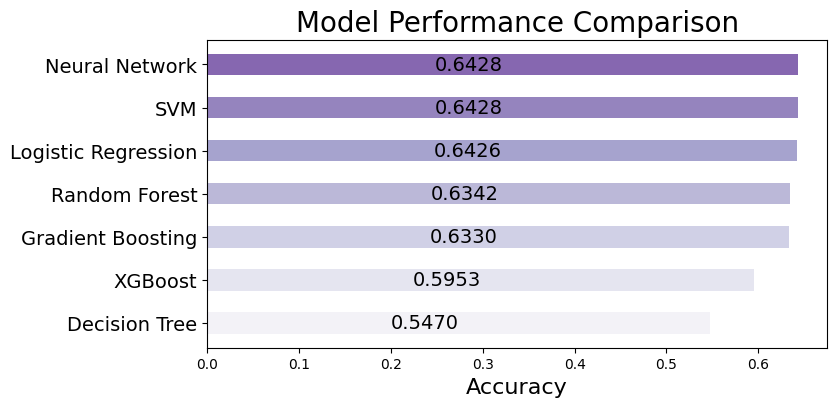

In [11]:
# Model names and corresponding pipelines
model_names = [
    "Logistic Regression",
    "SVM",
    "XGBoost",
    "Decision Tree",
    "Random Forest",
    "Gradient Boosting",
    "Neural Network",
]

pipes = [
    logistic_regression_pipe,
    svm_pipe,
    xgboost_pipe,
    decision_tree_pipe,
    random_forest_pipe,
    gradient_boosting_pipe,
    nn_pipe,
]

# Cross-validate each pipeline and collect the scores
cv_scores = []
for pipe, name in zip(pipes, model_names):
    cv_score = cross_val_score(pipe, X_train, y_train, cv=5, scoring="accuracy").mean()
    cv_scores.append(cv_score)
    print(f"Cross-validated accuracy for {name}: {cv_score}")

# Sorting the models by cross-validated accuracy in decreasing order
sorted_indices = np.argsort(cv_scores)[::-1]
sorted_model_names = [model_names[i] for i in sorted_indices]
sorted_cv_scores = [cv_scores[i] for i in sorted_indices]

# Plotting the results
fig, ax = plt.subplots(figsize=(8, 4))
y_pos = np.arange(len(sorted_model_names))

# Use a color palette
colors = sns.color_palette("Purples", len(sorted_model_names))[::-1]

# Adjust bar height
bar_height = 0.5

# Plotting accuracy bars
ax.barh(
    y_pos, sorted_cv_scores, align="center", alpha=0.7, color=colors, height=bar_height
)

ax.set_yticks(y_pos)
ax.set_yticklabels(sorted_model_names, fontsize=14)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel("Accuracy", fontsize=16)
ax.set_title("Model Performance Comparison", fontsize=20)

# Display accuracy scores on the bars
for i, acc in enumerate(sorted_cv_scores):
    ax.text(
        acc / 2, i, f"{acc:.4f}", color="black", va="center", ha="right", fontsize=14
    )

plt.savefig("../plots/models_accuracy.png", bbox_inches="tight")

plt.show()

Cross-validated accuracy for Logistic Regression: 0.6425514510942116
Cross-validated accuracy for SVM: 0.6427553246925807
Cross-validated accuracy for XGBoost: 0.5952729144997312
Cross-validated accuracy for Decision Tree: 0.5469685739851476
Cross-validated accuracy for Random Forest: 0.6341959553305058
Cross-validated accuracy for Gradient Boosting: 0.6329722985191136
Cross-validated accuracy for Neural Network: 0.6427553246925807


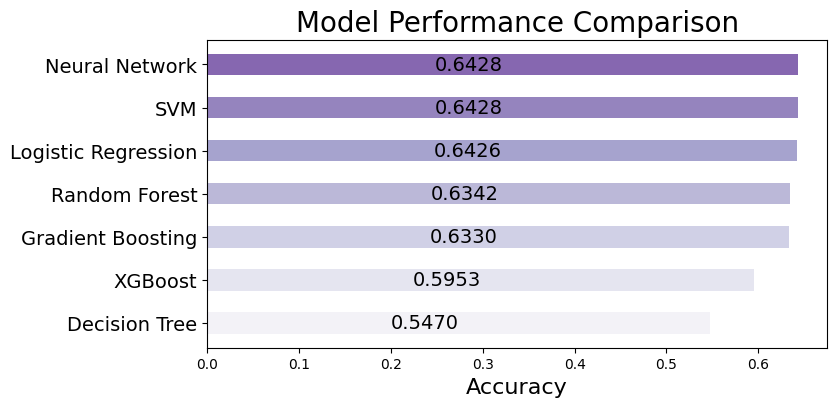

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score

# Model names and corresponding pipelines
model_names = [
    "Logistic Regression",
    "SVM",
    "XGBoost",
    "Decision Tree",
    "Random Forest",
    "Gradient Boosting",
    "Neural Network",
]

pipes = [
    logistic_regression_pipe,
    svm_pipe,
    xgboost_pipe,
    decision_tree_pipe,
    random_forest_pipe,
    gradient_boosting_pipe,
    nn_pipe,
]

# Cross-validate each pipeline and collect the scores
cv_scores = []
for pipe, name in zip(pipes, model_names):
    cv_score = cross_val_score(pipe, X_train, y_train, cv=5, scoring="accuracy").mean()
    cv_scores.append(cv_score)
    print(f"Cross-validated accuracy for {name}: {cv_score}")

# Sorting the models by cross-validated accuracy in decreasing order
sorted_indices = np.argsort(cv_scores)[::-1]
sorted_model_names = [model_names[i] for i in sorted_indices]
sorted_cv_scores = [cv_scores[i] for i in sorted_indices]

# Plotting the results
fig, ax = plt.subplots(figsize=(8, 4))
y_pos = np.arange(len(sorted_model_names))

# Use a color palette
colors = sns.color_palette("Purples", len(sorted_model_names))[::-1]

# Adjust bar height
bar_height = 0.5

# Plotting accuracy bars
ax.barh(
    y_pos, sorted_cv_scores, align="center", alpha=0.7, color=colors, height=bar_height
)

ax.set_yticks(y_pos)
ax.set_yticklabels(sorted_model_names, fontsize=14)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel("Accuracy", fontsize=16)
ax.set_title("Model Performance Comparison", fontsize=20)

# Display accuracy scores on the bars
for i, acc in enumerate(sorted_cv_scores):
    ax.text(
        acc / 2, i, f"{acc:.4f}", color="black", va="center", ha="right", fontsize=14
    )

# Set the background color of the figure and axis to white
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# Save the plot with white background
plt.savefig(
    "../plots/models_accuracy.png",
    bbox_inches="tight",
    facecolor=fig.get_facecolor(),
    edgecolor="none",
)

plt.show()

Based on the above accuracies, I picked the SVM for fine-tuning. This model yielded the highest accuracy but it was better for fine-tuning than the logistic regression, and simplier than NN. However, I also tried to fine-tune the NN just for practice (and hope). 

In [13]:
# Fit preprocessing on the entire dataset
X_train_preprocessed = preproc_basic.fit_transform(X_train)

# Convert the transformed data to a DataFrame
X_train_preprocessed_df = pd.DataFrame(
    X_train_preprocessed,
    columns=continuous_vars
    + list(
        preproc_basic.named_transformers_["cat"].get_feature_names_out(categorical_vars)
    ),
)

#### Check multicollinearity

In [14]:
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_preprocessed_df.columns
vif_data["VIF"] = [
    variance_inflation_factor(X_train_preprocessed_df.values, i)
    for i in range(X_train_preprocessed_df.shape[1])
]

In [15]:
vif_data

,Feature,VIF
0,Age,3.626279
1,Heart Rate,3.696081
2,Exercise Hours Per Week,3.740786
3,Stress Level,3.265758
4,Sedentary Hours Per Day,3.780953
5,Income,3.756340
6,BMI,3.805300
7,Triglycerides,3.752771
8,Physical Activity Days Per Week,3.283073
9,Sleep Hours Per Day,3.176531


### Check features' distribution

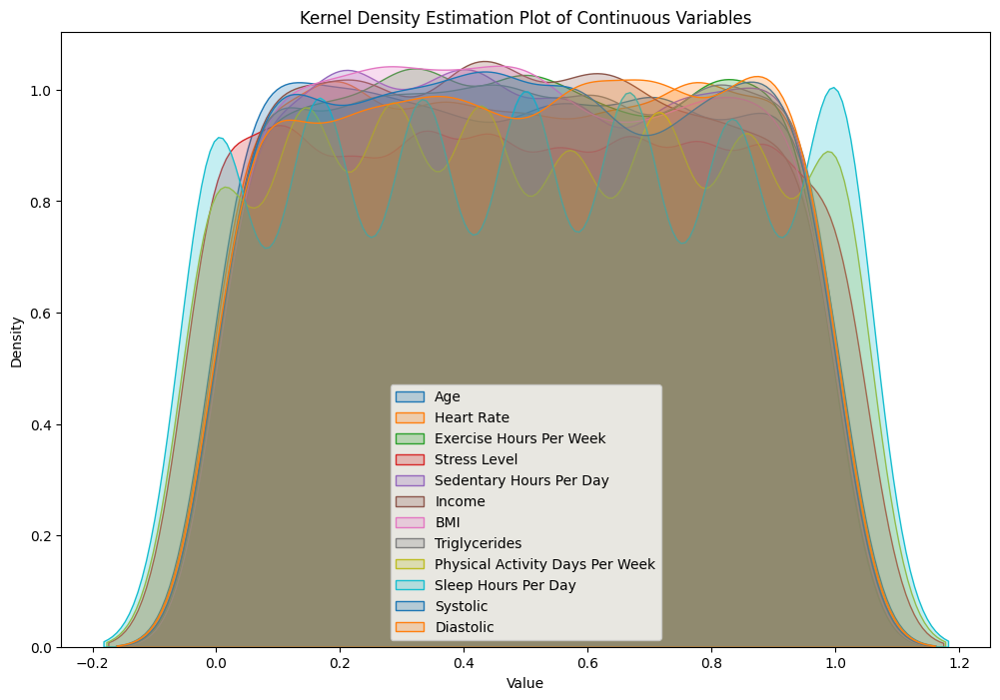

In [16]:
# Select only the continuous variables
number_of_features = len(continuous_vars)
continuous_data = X_train_preprocessed_df.iloc[:, :number_of_features]
continuous_df = pd.DataFrame(continuous_data, columns=continuous_vars)

# Plot KDE for each continuous variable
plt.figure(figsize=(12, 8))
for column in continuous_df.columns:
    sns.kdeplot(continuous_df[column], label=column, fill=True)

plt.title("Kernel Density Estimation Plot of Continuous Variables")
plt.xlabel("Value")
plt.ylabel("Density")
plt.legend()
plt.show()

Because of the one-hot-encoding all categorical features now take 2 values (0 or 1), so I will stack them accordingly.

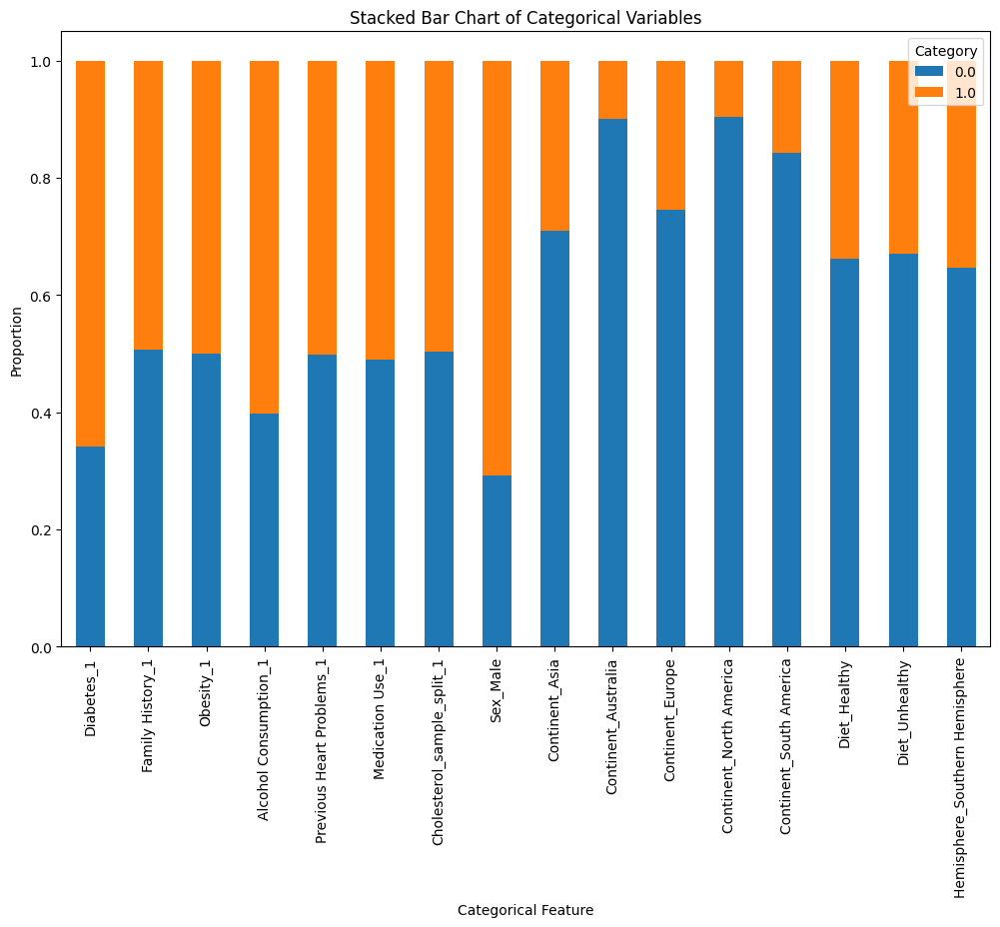

In [17]:
# Select categorical features
continuous_feature_count = len(continuous_vars)
categorical_data = X_train_preprocessed_df.iloc[:, continuous_feature_count:]

categorical_df = pd.DataFrame(categorical_data)

# Aggregate counts for the plot
proportions_df = categorical_df.apply(lambda x: x.value_counts(normalize=True)).T

# Plot stacked bar chart
proportions_df.plot(kind="bar", stacked=True, figsize=(12, 8))

plt.title("Stacked Bar Chart of Categorical Variables")
plt.xlabel("Categorical Feature")
plt.ylabel("Proportion")
plt.legend(title="Category")
plt.show()

### Fine tuning the NN

In [18]:
# Define the Keras model as a function
def create_nn_model(activation="relu", optimizer="adam"):
    model = Sequential()
    model.add(Input(shape=(28,)))  # Use Input layer to define the input shape
    model.add(Dense(64, activation=activation))
    model.add(Dense(32, activation=activation))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model


# Create KerasClassifier with default parameters
model = KerasClassifier(model=create_nn_model, verbose=0)

# Define parameters for grid search
param_grid = {
    "batch_size": [16, 32],
    "epochs": [50, 100],
    "model__activation": ["relu", "tanh"],
    "model__optimizer": ["adam", "sgd"],
}

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring="accuracy")
grid_result = grid.fit(X_train_preprocessed, y_train)

# Print results
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")

Best: 0.6429590084465481 using {'batch_size': 32, 'epochs': 50, 'model__activation': 'relu', 'model__optimizer': 'sgd'}


### Fine tuning the SVM model

In [19]:
svm_pipe = Pipeline([("preprocessing", preproc_basic), ("svm", SVC())])

# Parameter grid for GridSearchCV
param_grid = {
    "svm__C": [0.0001, 0.001, 0.01, 0.05, 0.1],
    "svm__class_weight": [None, "balanced"],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=svm_pipe, param_grid=param_grid, cv=5, scoring="accuracy", n_jobs=8
)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated Accuracy:", grid_search.best_score_)

# Evaluate on test set
test_accuracy = grid_search.score(X_test, y_test)
print("Test Set Accuracy:", test_accuracy)

Best Parameters: {'svm__C': 0.0001, 'svm__class_weight': None}
Best Cross-Validated Accuracy: 0.6427553246925807
Test Set Accuracy: 0.6428911079410367


## PREDICT

In [20]:
df_kaggle_test = pd.read_csv("../data/test.csv")  # read in test data provided by Kaggle

In [21]:
# preprocess Kaggle data
df_kaggle_test = df_kaggle_test.copy()

split_blood_pressure(df=df_kaggle_test)
split_cholesterol_sample(df=df_kaggle_test)
exercise_total(df=df_kaggle_test)
systolic_diastolic_ratio_constructor(df=df_kaggle_test)

X_df_kaggle_test_selected = df_kaggle_test[continuous_vars + categorical_vars]

In [22]:
# Create SVM pipeline with best parameters
best_params = {"C": 0.0001, "kernel": "linear", "gamma": "scale", "class_weight": None}

svm_pipe = Pipeline(
    [
        ("preprocessor", preproc_basic),
        ("classifier", SVC(**best_params, random_state=6)),
    ]
)

# Train the SVM model on the entire preprocessed training dataset
svm_pipe.fit(X_selected, y)

# Make predictions on the df_kaggle_test data
kaggle_test_predictions_v3_svc = svm_pipe.predict(X_df_kaggle_test_selected)
sum(kaggle_test_predictions_v3_svc)

0

In [23]:
# Create KerasClassifier with best parameters

best_params = {"activation": "tanh", "batch_size": 64, "epochs": 30, "optimizer": "sgd"}
model = KerasClassifier(build_fn=create_nn_model, **best_params, verbose=0)

# Create pipeline for NN
nn_pipe = Pipeline([("preprocessor", preproc_basic), ("classifier", model)])

# Fit the pipeline on the preprocessed training dataset
nn_pipe.fit(X_train, y_train)

# Make predictions on the X_df_kaggle_test_selected data
kaggle_test_predictions_v3_nn = nn_pipe.predict(X_df_kaggle_test_selected)
kaggle_test_predictions_v3_nn = kaggle_test_predictions_v3_nn.ravel()

# Print predictions
sum(kaggle_test_predictions_v3_nn)

30

### Prepare submission

In [24]:
kaggle_test_predictions_V3 = {
    "Patient ID": df_kaggle_test["Patient ID"],
    "Heart Attack Risk": kaggle_test_predictions_v3_svc,
}
# predict_df = pd.DataFrame(df_kaggle_preprocessed.index, kaggle_test_predictions)
df_kaggle_predicted_V3 = pd.DataFrame(kaggle_test_predictions_v3_svc)
df_kaggle_predicted_V3

,0
0,0
1,0
2,0
3,0
4,0
...,...
1748,0
1749,0
1750,0
1751,0


In [25]:
df_kaggle_predicted_V3.to_csv("../submission/df_kaggle_predicted_V3.csv", index=False)